In [1]:
root = '/local_storage/datasets/sgerard/xview2/'

import pandas as pd
import json
import geopandas as gpd
import glob
import matplotlib.pyplot as plt
import folium

In [2]:
df = []
for part in ["train", "tier3", "test"]:
    for filename in glob.glob(root + part + "/labels/*_pre_disaster.json"):
        situation = filename.split("/")[-1].split("_")[0]
        with open(filename) as f:
            data = json.load(f)
            lng_lat = data["features"]["lng_lat"]
            if len(lng_lat) == 0:
                continue
            else:
                coords = data["features"]["lng_lat"][0]["wkt"]
                coords = coords.replace("POLYGON ((", "").replace("))", "")
                coords = coords.split(",")[0]
                long, lat = coords.split(" ")
                df.append({"Event": situation, "Set": part,
                            "Longitude": long, "Latitude": lat})
df = pd.DataFrame(df)
df.head()

,Event,Set,Longitude,Latitude
0,socal-fire,train,-118.762364646417,34.0258323936459
1,socal-fire,train,-118.9022981505265,34.04328255708986
2,mexico-earthquake,train,-99.22305212076203,19.35911352235104
3,hurricane-michael,train,-85.61884991269967,30.24454665616031
4,midwest-flooding,train,-92.32235632393103,34.7413866332205


<Axes: >

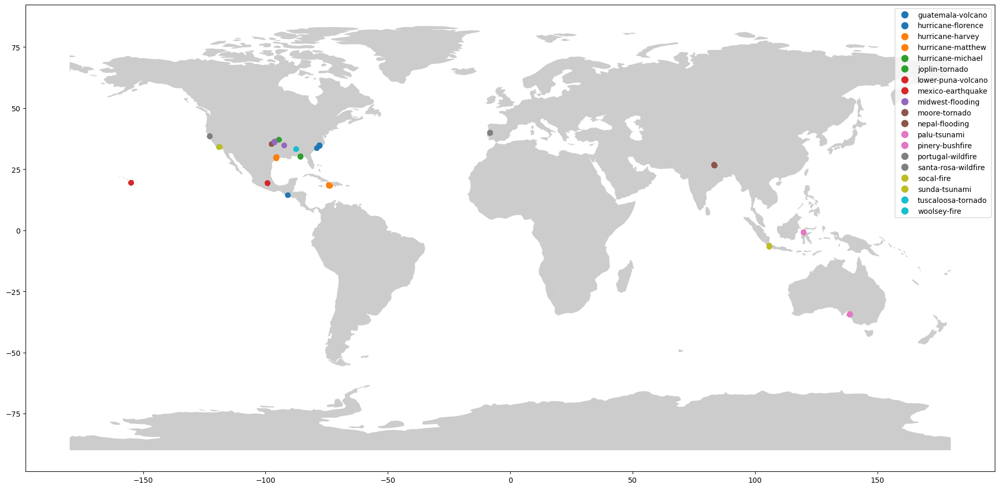

In [4]:
geometry = gpd.points_from_xy(df.Longitude, df.Latitude)
geo_df = gpd.GeoDataFrame(df, geometry=geometry)

world = gpd.read_file(
    gpd.datasets.get_path("naturalearth_lowres"))
fig,ax = plt.subplots(figsize=(24, 18))
world.plot(ax=ax, alpha=0.4, color="grey")
geo_df.plot(column="Event", ax=ax, legend=True)

<Axes: >

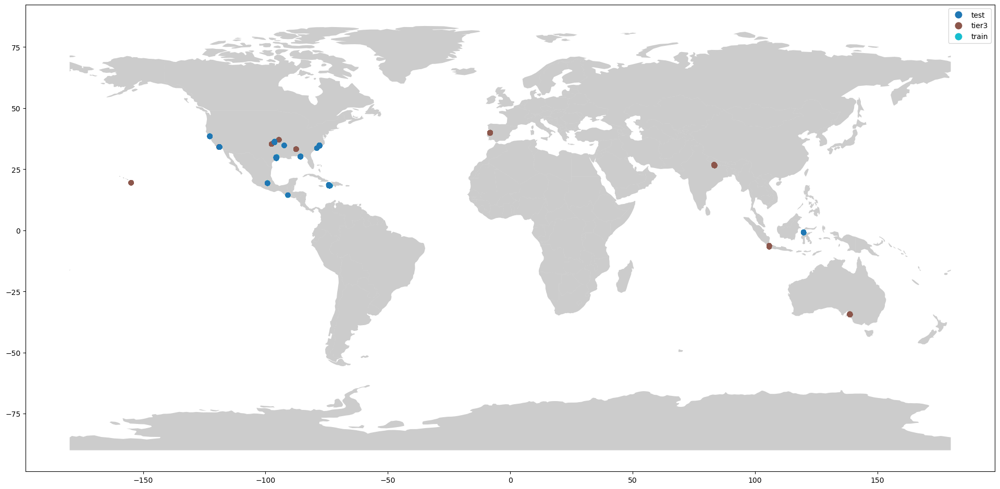

In [5]:
fig, ax = plt.subplots(figsize=(24, 18))
world.plot(ax=ax, alpha=0.4, color="grey")
geo_df.plot(column="Set", ax=ax, legend=True)

In [6]:
# Use terrain map layer to see volcano terrain
map = folium.Map(location=[4, 10], tiles="Stamen Terrain", zoom_start=3)

In [7]:
# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry]

# Iterate through list and add a marker for each volcano, color-coded by its type.
for i,coordinates in enumerate(geo_df_list):
    # assign a color marker for the type of volcano, Strato being the most common
    if geo_df.Set[i] == "train":
        type_color = "green"
    elif geo_df.Set[i] == "test":
        type_color = "blue"
    elif geo_df.Set[i] == "hold":
        type_color = "orange"
    elif geo_df.Set[i] == "train3":
        type_color = "pink"
    else:
        type_color = "purple"

    # Place the markers with the popup labels and data
    map.add_child(
        folium.Marker(
            location=coordinates,
            popup=
                 "Event: " + str(geo_df.Event[i]) + "<br>"
                + "Set: " + str(geo_df.Set[i]) + "<br>"
                + "Coordinates: " + str(geo_df_list[i]),
            icon=folium.Icon(color="%s" % type_color),
        )
    )



In [8]:
map
